In [1]:
import h5py
import os
import scipy.io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob, os
import matplotlib.patches as patches
sns.set_style('darkgrid')
import pickle
from matplotlib import gridspec
from matplotlib.lines import Line2D
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
sns.set_context("poster", rc={"font.size":18,"axes.titlesize":18,"axes.labelsize":18}) 
import matplotlib 
matplotlib.rc('xtick', labelsize=14) 
matplotlib.rc('ytick', labelsize=14) 

In [4]:
os.chdir('/Users/trongnguyen/Dropbox/FattyLiver/src/hydrogen/')

In [6]:
os.chdir('/Users/trongnguyen/Dropbox/FattyLiver/src/hydrogen/')
from helper_brl.outlierDetection import getBSC_Att, envDetection, filter_BSC_based_on_depth, findOutliers

In [7]:
from helper_brl import fattyLiver

In [8]:
from helper_brl.visualizeHelper import extract_segment_points

In [9]:
newdataBase = pd.read_excel('/Users/trongnguyen/Dropbox/FattyLiver/Rabbit_Liver_40.xlsx', sheet_name=0)
aliveOnly = newdataBase[newdataBase['Timely death'] == 1][['Rabbit', 'Weeks on diet', 'Lipid']]
dataBase = newdataBase[['Rabbit', 'Injection level', 'Weeks on diet','Lipid']]
dataBase = dataBase[dataBase['Injection level'] ==0]

threshold_lipid = 11
dataBase['High_fat'] = dataBase.Lipid > threshold_lipid
dataBase = dataBase.sort_values(['Lipid'])
dataBase.index = range(1, 16)

In [10]:
#badRabbits = [731, 740, 747, 739, 730, 741, 750, 749, 748, 751, 756]
#for bad_rabbit in badRabbits:
#    dataBase = dataBase[dataBase.Rabbit != bad_rabbit]
dataBase

,Rabbit,Injection level,Weeks on diet,Lipid,High_fat
1,729,0.0,0,3.27,False
2,749,0.0,0,3.29,False
3,750,0.0,0,4.10,False
4,752,0.0,1,6.60,False
5,730,0.0,2,7.22,False
6,739,0.0,1,7.50,False
7,751,0.0,1,8.20,False
8,754,0.0,2,9.81,False
9,753,0.0,2,10.92,False
10,740,0.0,3,13.17,True


In [11]:
ATTs_dict, freq_att_dict, freq_bsc_dict, depth_dict, BSCs_dict = {}, {}, {}, {}, {} 
left_dict, right_dict, top_dict, bottom_dict = {}, {}, {}, {} # ROIs of each BSC
att_bottom, bad_BSC = {}, {}
name_tag = 'fix_bug_average_ref_phantom_6MHz_v7_10a_30b'
for index, row in dataBase.iterrows():
    number = row.Rabbit
    number = str(int(number))
    print(number, end = ', ')
    path = "/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L" + number + "/L94_left/BSC_ATT/"
    ATTs_dict[number], freq_att_dict[number], BSCs_dict[number], freq_bsc_dict[number], \
    depth_dict[number], left_dict[number], right_dict[number], \
    top_dict[number], bottom_dict[number], att_bottom[number], bad_BSC[number] = getBSC_Att(path,name_tag)

729, 749, 750, 752, 730, 739, 751, 754, 753, 740, 731, 755, 757, 756, 758, 

In [12]:
for index, row in dataBase.iterrows():
    number = row.Rabbit
    number = str(int(number))
    print(number, end = ': ')
    print(len(ATTs_dict[number]), len(BSCs_dict[number]), end = '\t')

729: 50 44	749: 50 46	750: 43 14	752: 50 45	730: 42 30	739: 50 50	751: 41 47	754: 50 50	753: 50 50	740: 50 43	731: 47 41	755: 50 49	757: 50 50	756: 49 32	758: 50 50	

# Loading RF data 

In [16]:
%qtconsole

In [13]:
sns.set_style('white')

In [14]:
rf_path = '/Volumes/TrongDrive/Liver_Study/RF_hdf5/'

In [15]:
hf = h5py.File(rf_path + number + '.h5', 'r')
gp = hf.get('L94/Left')
image = np.array(gp.get(str(2)))
hf.close()

In [16]:
fs = 40e6 * 1.0
speedOfSound = 1540.0
lateralDistance = 38
lineLength  = image.shape[0]
axialDistance = lineLength * speedOfSound/2 / fs * 1000
extent = [0, lateralDistance, 0, axialDistance]

# Load reference phantom

729,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L729/RF/newSegmentPoints/


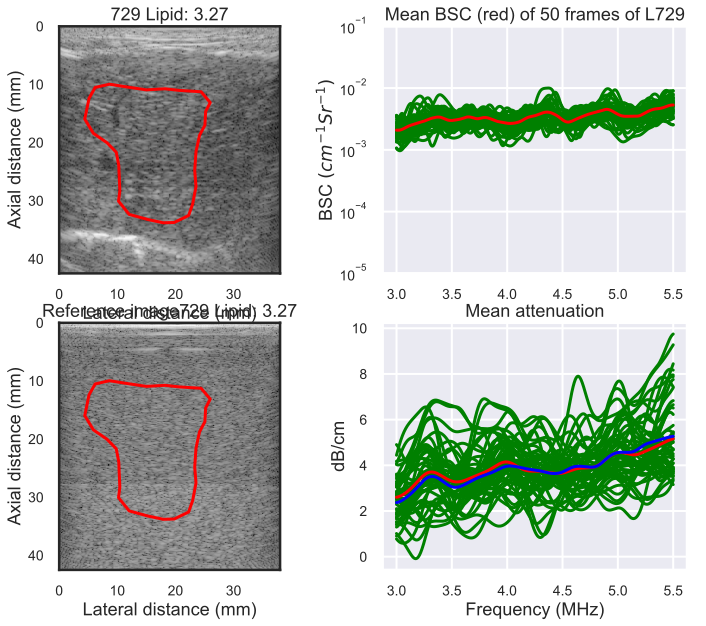

749,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L749/RF/newSegmentPoints/


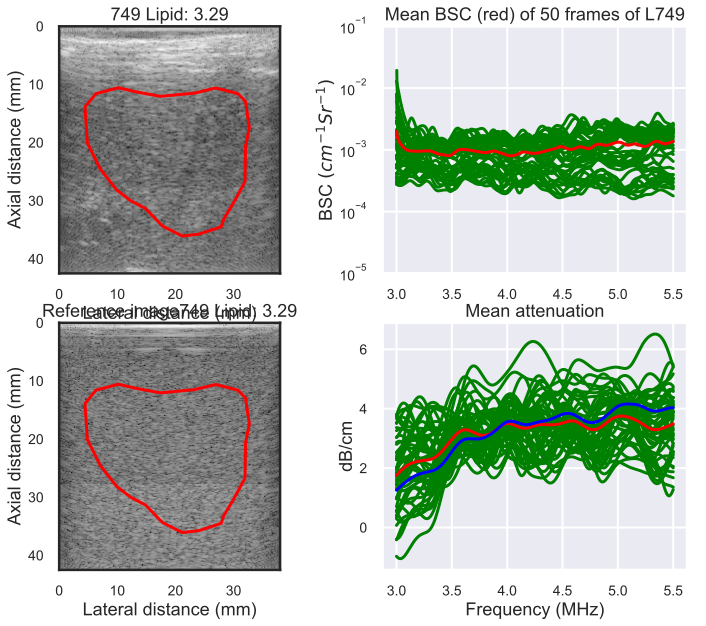

750,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L750/RF/newSegmentPoints/


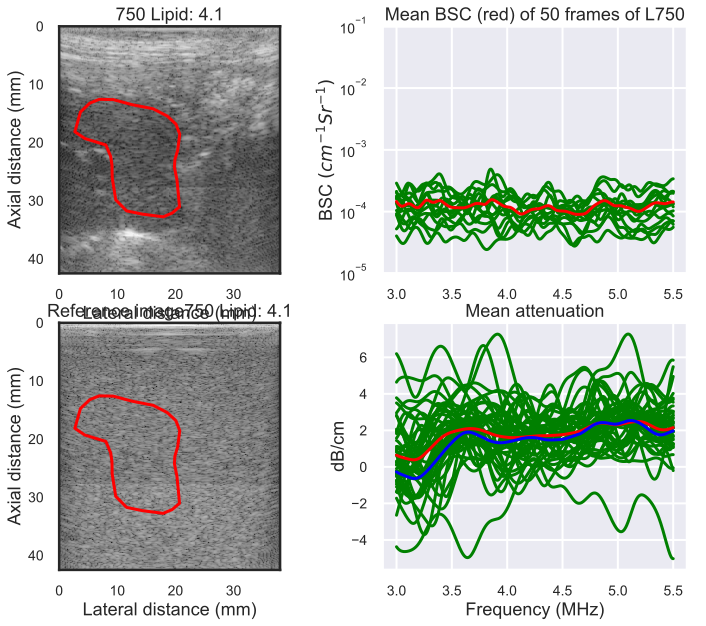

752,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L752/RF/newSegmentPoints/


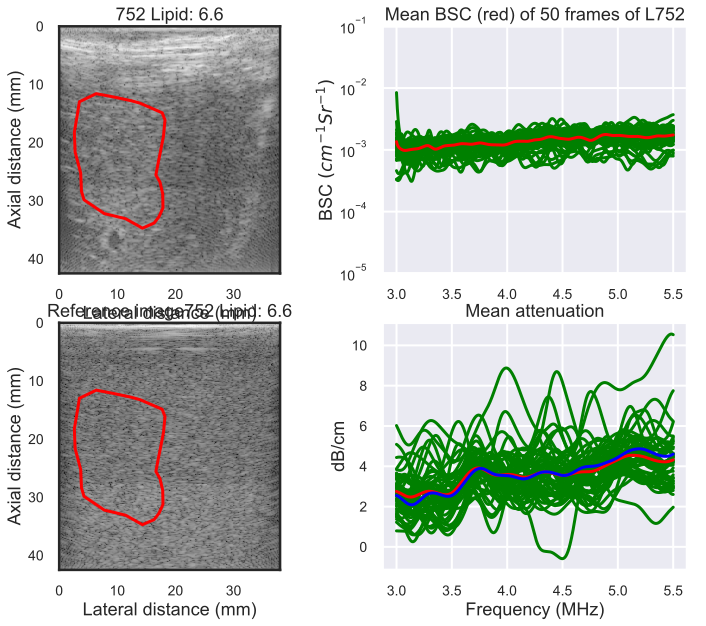

730,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L730/RF/newSegmentPoints/


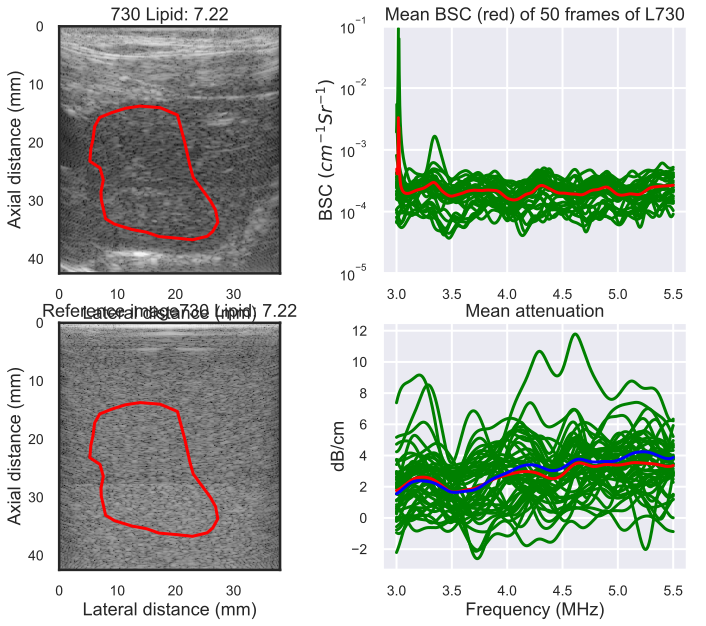

739,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L739/RF/newSegmentPoints/


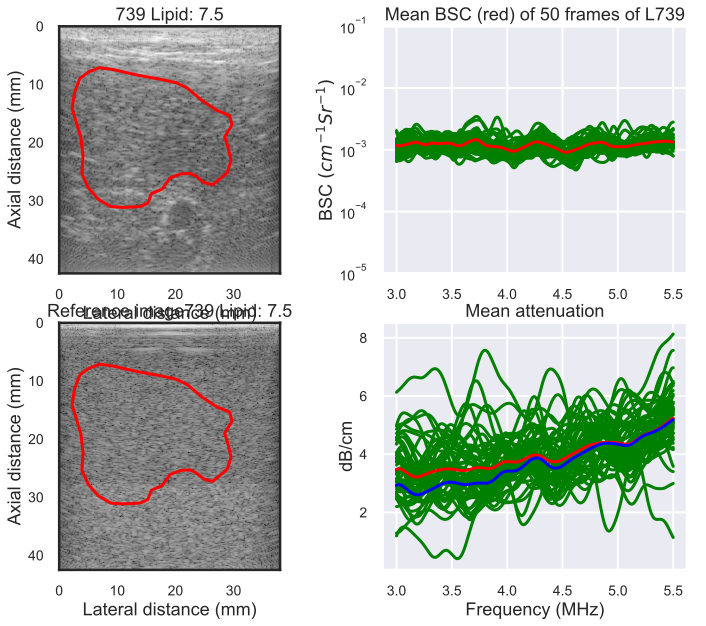

751,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L751/RF/newSegmentPoints/


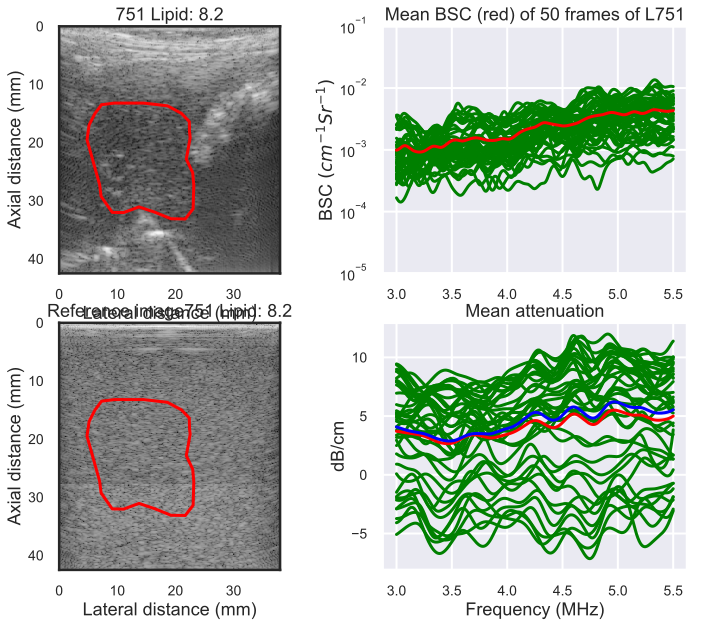

754,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L754/RF/newSegmentPoints/


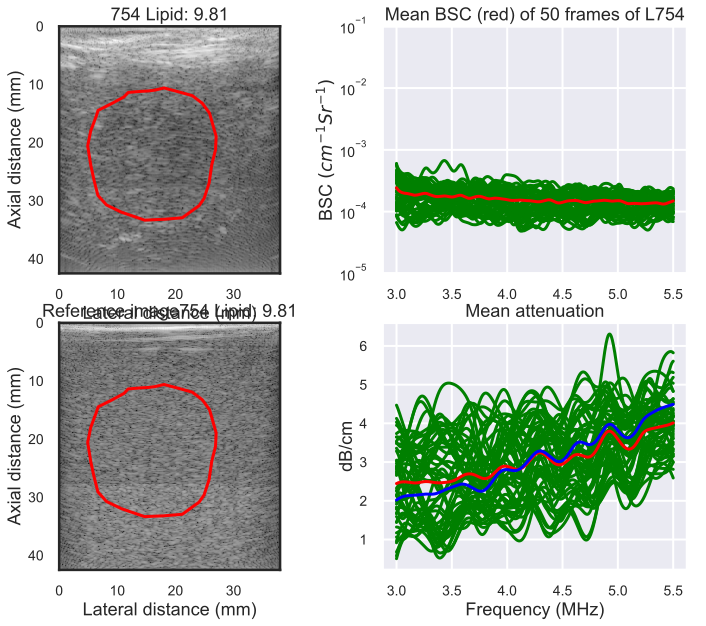

753,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L753/RF/newSegmentPoints/


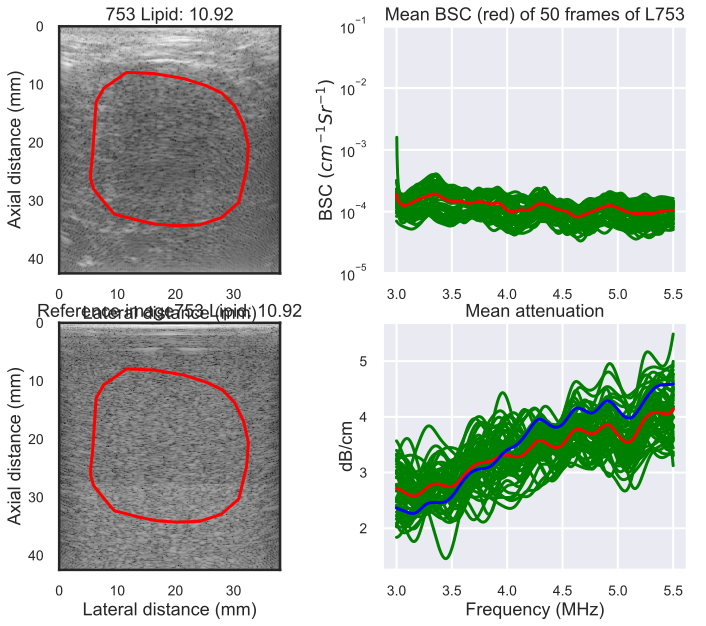

740,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L740/RF/newSegmentPoints/


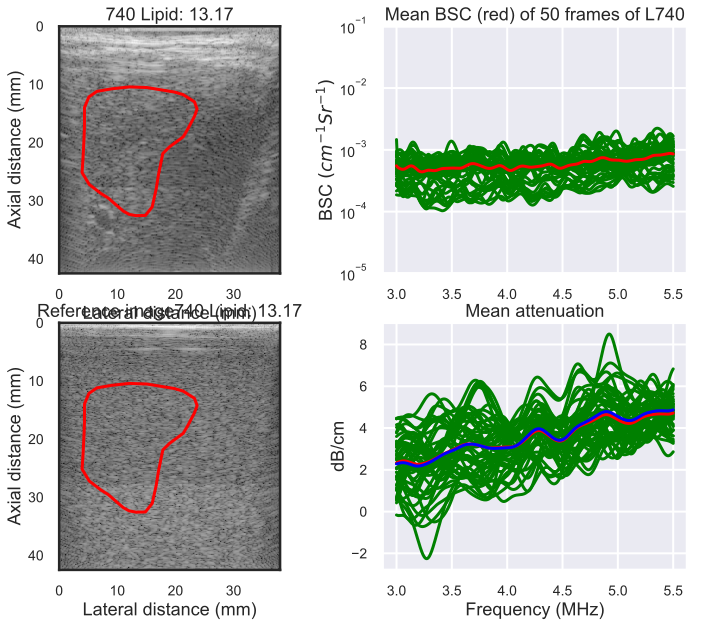

731,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L731/RF/newSegmentPoints/


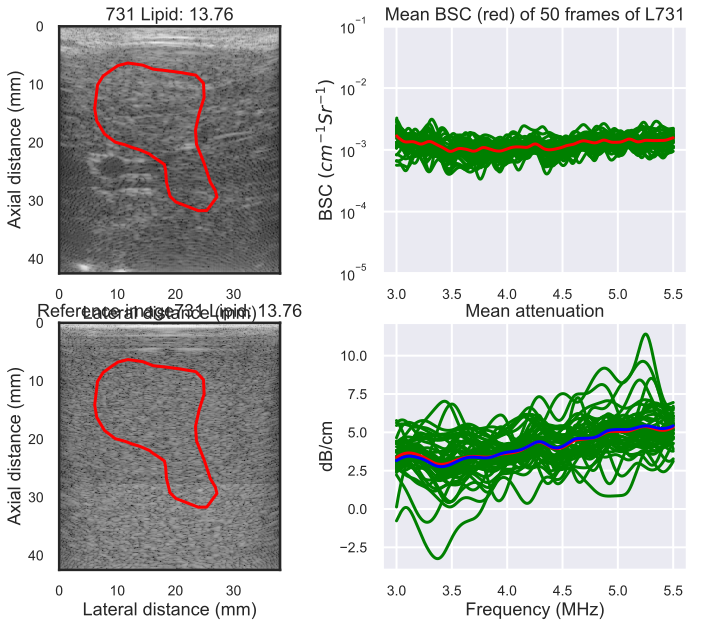

755,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L755/RF/newSegmentPoints/


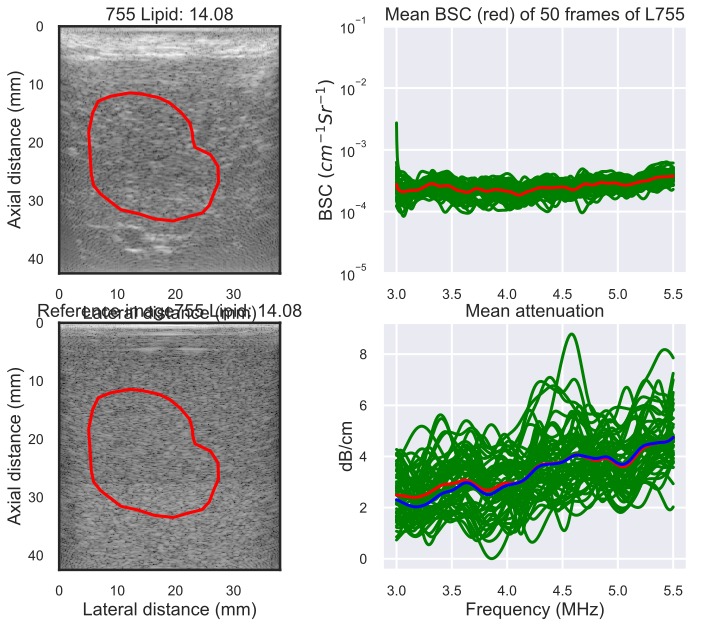

757,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L757/RF/newSegmentPoints/


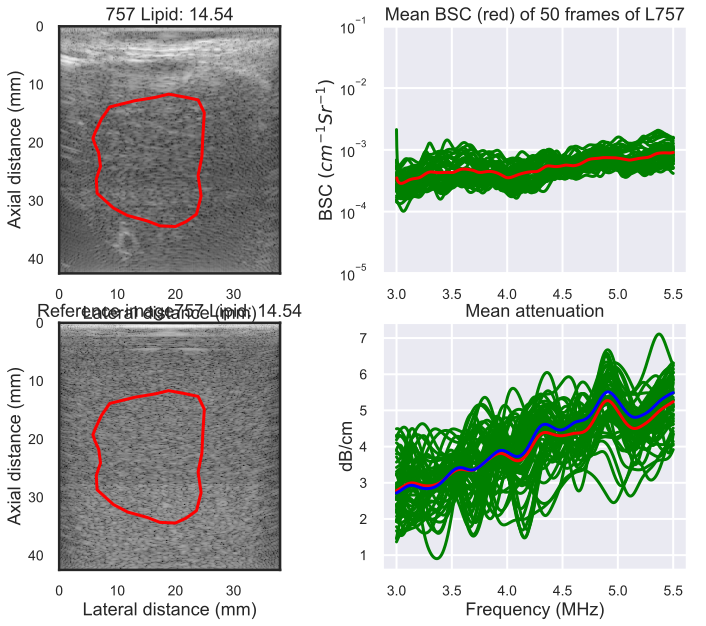

756,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L756/RF/newSegmentPoints/


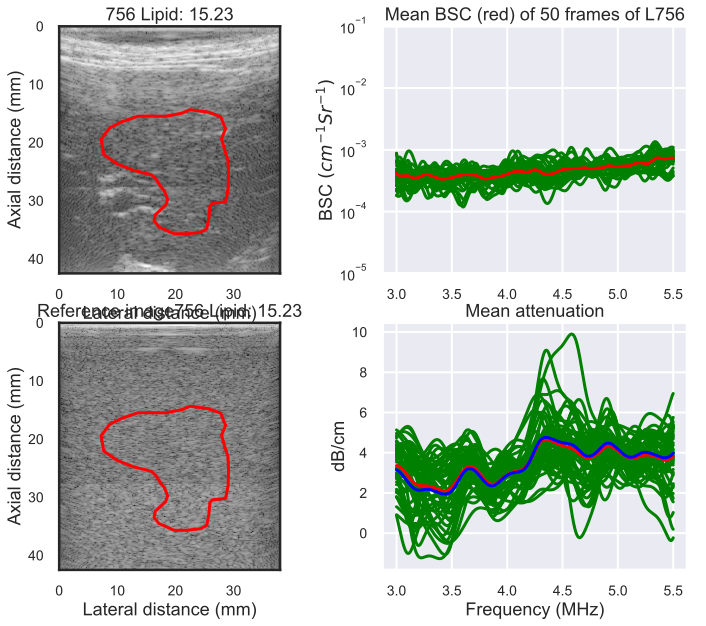

758,/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L758/RF/newSegmentPoints/


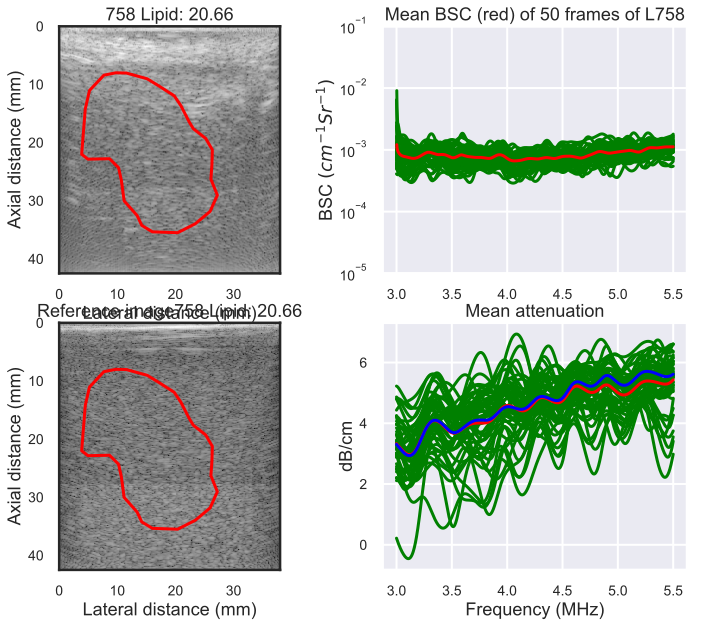

In [20]:
root_path = '/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L'
for index, row in dataBase.iterrows():
    number = str(int(row.Rabbit))
    print(number, end = ',')
    lipid = row.Lipid
    if (number == '760' or number == '769'):
        continue
    #if (number in rf_data_dict1):
    #    rpData = rf_data_dict1[number] # all of the RF data
    #else:
    #    continue
    fig = plt.figure(figsize = (12, 10))
    gs = gridspec.GridSpec(2, 2, width_ratios=[2, 2], height_ratios=[1, 1]) 
    ax1 = plt.subplot(gs[0])
    frameNumber = 10
    path = root_path+number+'/RF/newSegmentPoints/'
    segmentPoints = extract_segment_points(path, frameNumber)
    
    hf = h5py.File(rf_path + number + '.h5', 'r')
    gp = hf.get('L94/Left')
    image = np.array(gp.get(str(frameNumber)))
    
    gp1 = hf.get('L94/Ref')
    ref_image = np.array(gp1.get(str(frameNumber)))
    hf.close()
    
    #image = rpData[:,:, frameNumber] # a single frame
    envIm = envDetection(image) # the envelope image
        
    ax1.imshow(np.flipud(envIm), vmax = 0, vmin = -80, extent = extent, \
                  aspect = 1,  cmap=plt.cm.gray)

    ax1.invert_yaxis()
    ax1.set_title(str(number) + ' Lipid: '+ str(lipid))
    ax1.set_xlabel('Lateral distance (mm)')
    ax1.set_ylabel('Axial distance (mm)')
    line = Line2D(segmentPoints[0,:], segmentPoints[1,:], color = 'r', linewidth = '3')    
    ax1.add_line(line)
    # plot mean BSCs
    with sns.axes_style('darkgrid'):
        ax2 = plt.subplot(gs[1])
    bscs = BSCs_dict[number]
    if (len(bscs) ==0):
        continue
    freq_key = next(iter(freq_bsc_dict[number]))
    freq = freq_bsc_dict[number][freq_key].flatten()
    mean_bsc = np.zeros(1024)
    
    for k, v in (bscs.items()):
        bsc_single_frame = np.mean(v, axis = 1)
        ax2.semilogy(freq, bsc_single_frame, 'g')
        mean_bsc = mean_bsc + bsc_single_frame
    ax2.set_title('Mean BSC (red) of 50 frames of L'+ number)
    mean_bsc = mean_bsc / len(bscs)
    ax2.semilogy(freq, mean_bsc, 'r')
    #ax2.set_xlabel('Frequency (MHz)')
    ax2.set_ylabel('BSC $(cm^{-1}Sr^{-1})$')
    ax2.set_ylim([10**-5,10**-1])
    
    #ref_image = rf_reference_dict[number][:,:,frameNumber]
    ref_envIm = envDetection(ref_image)
    ax4 = plt.subplot(gs[2])
    ax4.imshow(np.flipud(ref_envIm), vmax = 0, vmin = -80, extent = extent, \
                  aspect = 1,  cmap=plt.cm.gray)
    line = Line2D(segmentPoints[0,:], segmentPoints[1,:], color = 'r', linewidth = '3')    


    ax4.invert_yaxis()
    ax4.add_line(line)
    ax4.set_title('Reference image' + str(number) + ' Lipid: '+ str(lipid))
    ax4.set_xlabel('Lateral distance (mm)')
    ax4.set_ylabel('Axial distance (mm)')
 
    
    with sns.axes_style('darkgrid'):
        ax3 = plt.subplot(gs[3])
    atts = ATTs_dict[number]
    
    mean_att = np.zeros(1024)
    
    filter_att = np.zeros(1024)
    filter_count = 0
    for k, v in (atts.items()):
        count = 0
        mean_att_single_frame = np.zeros(1024)
        bottom_depth = att_bottom[number][k].flatten()
        for idx in range(bottom_depth.shape[0]): # goes through all the ROIs
            if ((bottom_depth[idx] < 43) and (bottom_depth[idx] >5)):
                slope, intercept = np.polyfit(freq, v[:, idx], 1)
                if (slope > 0): # if positive slope
                    mean_att_single_frame = mean_att_single_frame + v[:, idx]
                    count = count + 1
        if (count >0):
            mean_att_single_frame = mean_att_single_frame /count
            filter_count = filter_count + 1
            
        mean_att = mean_att + np.mean(v, axis = 1)
        ax3.plot(freq, np.mean(v, axis=1), color = 'g')
        filter_att = filter_att + mean_att_single_frame
        
    ax3.plot(freq, mean_att/len(atts), color = 'r', linewidth = '3')
    ax3.plot(freq, filter_att/filter_count, color = 'b', linewidth = '3')
    ax3.set_xlabel('Frequency (MHz)')
    ax3.set_ylabel('dB/cm')
    ax3.set_title('Mean attenuation')
    plt.show()
    #break

In [58]:
len(bscs)

0

In [48]:
os.path.dirname(path[:-1])

'/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L770/RF'

In [50]:
extract_segment_points(path, frameNumber)

array([[ 17.97024237,  13.76485637,   8.66324057,   6.18137343,
          3.63056553,   2.87221724,   2.69986535,   3.42374327,
          3.38927289,   3.32033214,   3.66503591,   4.28550269,
          6.35372531,  10.14546679,  12.24815978,  15.5228456 ,
         17.72894973,  19.79717235,  19.62482047,  19.07329443,
         19.48693896,  21.62410233,  20.86575404,  21.27939856,
         19.4179982 ,  18.86647217,  17.97024237],
       [  8.78173743,   8.12543582,   8.15997801,   8.81627962,
         11.30331732,  13.03042684,  16.86460996,  19.2134789 ,
         21.45872127,  24.9474825 ,  26.98547172,  27.50360458,
         28.09082181,  28.64349686,  28.85075   ,  28.60895467,
         26.95092953,  24.98202469,  23.22037298,  21.63143223,
         18.83351481,  16.10468178,  12.51229399,  11.44148609,
         10.16342504,   9.57620781,   8.78173743]])

# Attenuation analysis

In [73]:
len(ATTs_dict)

15

In [75]:
ATTs_dict.keys()

dict_keys(['729', '731', '739', '758', '756', '740', '750', '754', '757', '752', '755', '751', '749', '753', '730'])

In [77]:
ATTs_dict['730'].keys()

dict_keys(['17', '9', '22', '12', '38', '1', '29', '34', '23', '18', '45', '25', '3', '33', '31', '40', '4', '20', '11', '21', '5', '43', '30', '10', '32', '6', '36', '13', '42', '7', '39', '35', '19', '8', '2', '41'])

729,

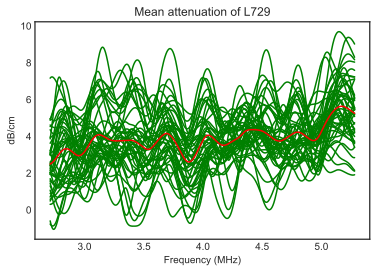

749,

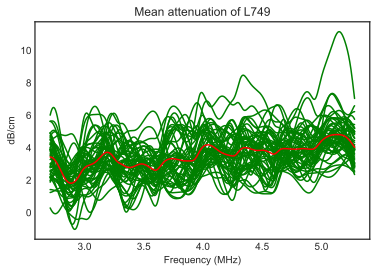

750,

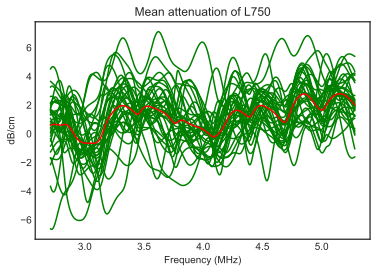

752,

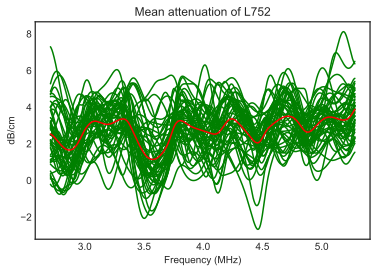

730,

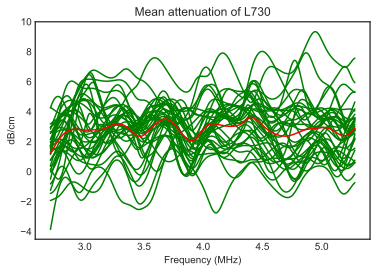

739,

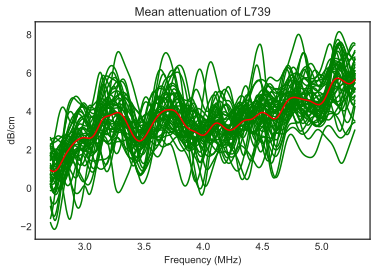

751,

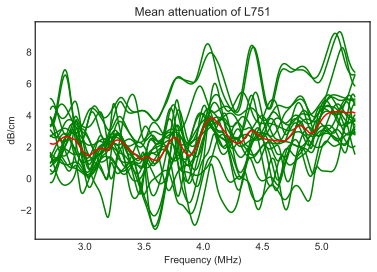

754,

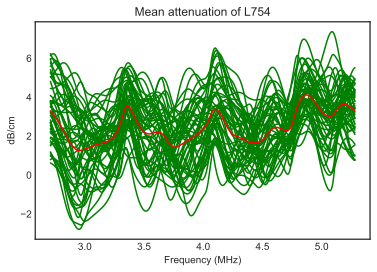

753,

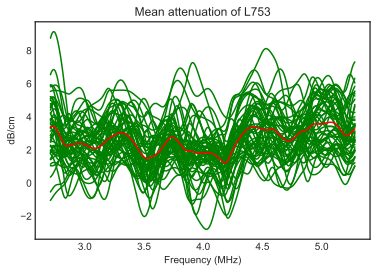

740,

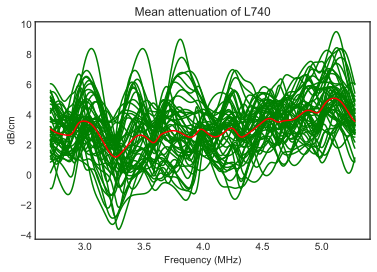

731,

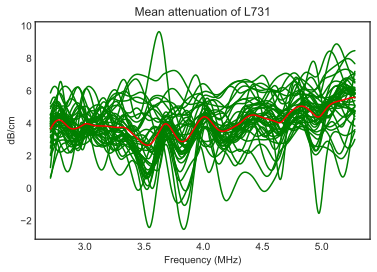

755,

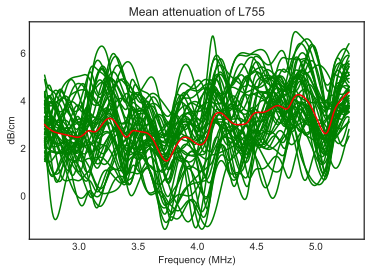

757,

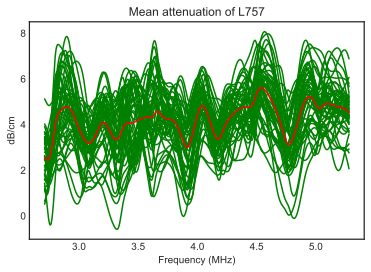

756,

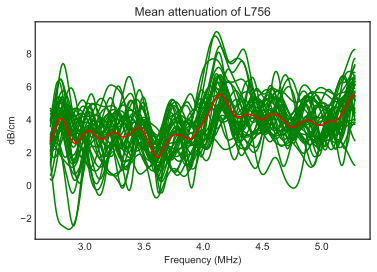

758,

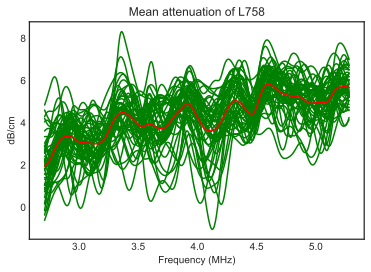

In [82]:
for index, row in dietOnly.iterrows():
    number = str(int(row.Rabbit))
    print(number, end = ',')
    lipid = row.Lipid
    atts = ATTs_dict[number]
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    mean_att = np.zeros(1024)
    for k, v in (atts.items()):
        ax.plot(freq, v, c = 'g')
        mean_att = mean_att + v.flatten()
    plt.plot(freq, mean_att/len(atts), c = 'r')
    ax.set_xlabel('Frequency (MHz)')
    ax.set_ylabel('dB/cm')
    ax.set_title('Mean attenuation of L'+ number)
    plt.show()
   